# Quantum GRU Model Evaluation Workflow

This notebook demonstrates the evaluation of a Quantum GRU (QGRU) model for PM2.5 air quality prediction using strict feature alignment and native data cadence. The workflow includes:

-   **Data Preparation:**

    -   Loading and parsing raw CSV data without resampling or filling.
    -   Strict feature matching to ensure consistency with training features.
    -   Building evaluation datasets with contiguous time windows and no missing values.

-   **Model Reconstruction:**

    -   Loading model configuration and weights from checkpoint.
    -   Rebuilding the QGRU model with the exact training parameters.

-   **Inference & Metrics:**

    -   Running inference on randomly sampled batches.
    -   Calculating regression metrics (MAE, RMSE) for PM2.5 predictions.
    -   Converting PM2.5 values to AQI categories for classification analysis.

-   **Classification Analysis:**
    -   Computing overall accuracy and detailed classification reports.
    -   Visualizing results with a confusion matrix.
    -   Displaying the distribution of predicted and actual air quality categories.

This approach ensures robust evaluation of the QGRU model's generalization performance on real-world air quality data.


In [1]:
import math
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pennylane as qml
import seaborn as sns
import torch
import torch.nn as nn
from sklearn.metrics import (accuracy_score, classification_report,
                             confusion_matrix)
from torch.utils.data import DataLoader, Dataset
from typing import List, Tuple, Optional, Dict, Union

Defines key parameters for model evaluation, including file paths, dataset size, device selection, and model architecture settings such as patch length, stride, feature count, hidden size, and quantum circuit details. These settings ensure reproducibility and strict alignment with the original training setup.


In [2]:
csv_path = "test_data_filtered.csv"  # path to your csv file
best_path = "quantum/runs" + "/best_qgru.pt"  # your best.ckpt path
examples_to_show = 10000  # number of examples runs
device = torch.device("cpu")  # device to run the model on

# Model config
NON_FEATURE_COLS = {
    "lon", "lat", "time", "source_file", "PM25_MERRA2", "PM25_ug_m3", "class"
}
L = 144  # input sequence length
P = 16  # patch length
S = 32  # stride
D_MODEL = 128  # model dimension
HIDDEN_SIZE = 128  # hidden size
N_QUBITS = 4  # number of qubits
N_QLAYERS = 1  # number of quantum layers
H_OUT = 72  # output size
F = 36  # feature input size

# QGRU + Positional Encoding

The Quantum GRU (QGRU) model integrates quantum-inspired recurrent units with classical neural network layers to capture complex temporal dependencies in air quality data. By leveraging positional encoding, the model preserves the order and timing of input sequences, enabling robust learning from contiguous time windows. This combination ensures that both feature interactions and temporal patterns are effectively represented, supporting accurate PM2.5 predictions and downstream classification tasks.


In [3]:
class zzfeatuermapQGRU(nn.Module):
    """
    Simplified Quantum GRU with fixed circuit depth and better initialization
    """

    def __init__(self, input_size, hidden_size, n_qubits=4, n_qlayers=1, backend="default.qubit"):
        super().__init__()
        self.n_inputs = input_size
        self.hidden_size = hidden_size
        self.concat_size = self.n_inputs + self.hidden_size
        self.n_qubits = n_qubits
        self.n_qlayers = n_qlayers
        self.backend = backend

        # Separate devices for each gate
        self.wires_reset = [f"wire_reset_{i}" for i in range(self.n_qubits)]
        self.wires_update = [f"wire_update_{i}" for i in range(self.n_qubits)]
        self.wires_new = [f"wire_new_{i}" for i in range(self.n_qubits)]

        self.dev_reset = qml.device(self.backend, wires=self.wires_reset)
        self.dev_update = qml.device(self.backend, wires=self.wires_update)
        self.dev_new = qml.device(self.backend, wires=self.wires_new)

        def _circuit_reset(inputs, weights):
            for n in range(n_qlayers):
                qml.templates.IQPEmbedding(
                    inputs, wires=self.wires_reset, n_repeats=2)
                qml.templates.BasicEntanglerLayers(
                    weights, wires=self.wires_reset)
                qml.templates.BasicEntanglerLayers(
                    weights, wires=self.wires_reset)
            return [qml.expval(qml.PauliZ(w)) for w in self.wires_reset]

        def _circuit_update(inputs, weights):
            for n in range(n_qlayers):
                qml.templates.IQPEmbedding(
                    inputs, wires=self.wires_update, n_repeats=2)
                qml.templates.BasicEntanglerLayers(
                    weights, wires=self.wires_update)
                qml.templates.BasicEntanglerLayers(
                    weights, wires=self.wires_update)
            return [qml.expval(qml.PauliZ(w)) for w in self.wires_update]

        def _circuit_new(inputs, weights):
            for n in range(n_qlayers):
                qml.templates.IQPEmbedding(
                    inputs, wires=self.wires_new, n_repeats=2)
                qml.templates.BasicEntanglerLayers(
                    weights, wires=self.wires_new)
                qml.templates.BasicEntanglerLayers(
                    weights, wires=self.wires_new)
            return [qml.expval(qml.PauliZ(w)) for w in self.wires_new]

        weight_shapes = {"weights": (n_qlayers, n_qubits)}
        self.qlayer_reset = qml.qnn.TorchLayer(
            qml.QNode(_circuit_reset,  self.dev_reset,  interface="torch"), weight_shapes)
        self.qlayer_update = qml.qnn.TorchLayer(
            qml.QNode(_circuit_update, self.dev_update, interface="torch"), weight_shapes)
        self.qlayer_new = qml.qnn.TorchLayer(
            qml.QNode(_circuit_new,    self.dev_new,    interface="torch"), weight_shapes)

        # Classical layers with better initialization
        self.clayer_in_gates = nn.Linear(self.concat_size, n_qubits)
        self.clayer_in_cand = nn.Linear(self.concat_size, n_qubits)
        self.clayer_out = nn.Linear(self.n_qubits, self.hidden_size)

        # Initialize classical layers properly
        self._init_weights()

    def _init_weights(self):
        """Better initialization for quantum-classical interface"""
        for layer in [self.clayer_in_gates, self.clayer_in_cand, self.clayer_out]:
            # Small gain for quantum stability
            nn.init.xavier_uniform_(layer.weight, gain=0.1)
            nn.init.zeros_(layer.bias)

    def forward(self, x, init_state=None):
        """
        x: [B, N, input_size]  tokens from Patch+PosEnc
        returns: hidden_seq [B, N, hidden], h_T
        """
        B, N, _ = x.size()
        hidden_seq = []

        if init_state is None:
            h_t = torch.zeros(B, self.hidden_size,
                              device=x.device, dtype=x.dtype)
        else:
            h_t = init_state

        for t in range(N):
            x_t = x[:, t, :]                              # [B, input_size]
            v_t = torch.cat((h_t, x_t), dim=1)            # [B, hidden+input]

            # Scale inputs to quantum layers (important!)
            # [B, n_qubits] bounded [-1,1]
            y_t = torch.tanh(self.clayer_in_gates(v_t))

            # Quantum processing with proper scaling
            r_raw = self.qlayer_reset(y_t)    # [B, n_qubits] in [-1,1]
            z_raw = self.qlayer_update(y_t)   # [B, n_qubits] in [-1,1]

            # Map quantum outputs to gate values
            r_t = torch.sigmoid(self.clayer_out(
                r_raw))   # [B, hidden] in [0,1]
            z_t = torch.sigmoid(self.clayer_out(
                z_raw))   # [B, hidden] in [0,1]

            # Candidate state
            v_cand = torch.cat((r_t * h_t, x_t), dim=1)   # [B, hidden+input]
            y_cand = torch.tanh(self.clayer_in_cand(v_cand)
                                )  # [B, n_qubits] bounded
            n_raw = self.qlayer_new(y_cand)               # [B, n_qubits]
            # [B, hidden] in [-1,1]
            n_t = torch.tanh(self.clayer_out(n_raw))

            # GRU update
            h_t = (1.0 - z_t) * n_t + z_t * h_t
            hidden_seq.append(h_t.unsqueeze(1))

        hidden_seq = torch.cat(hidden_seq, dim=1)         # [B, N, hidden]
        return hidden_seq, h_t


class PatchPosEncoder(nn.Module):
    def __init__(self, in_features, patch_len=16, stride=8, d_model=128):
        super().__init__()
        self.P, self.S, self.F, self.d = patch_len, stride, in_features, d_model
        self.proj = nn.Linear(self.P * self.F, self.d)

    def forward(self, x):           # x: [B, L, F]
        B, L, F = x.shape
        starts = range(0, L - self.P + 1, self.S)
        patches = [
            x[:, s:s+self.P, :].reshape(B, self.P*self.F) for s in starts]
        T = torch.stack(patches, dim=1)              # [B, N, P*F]
        T = self.proj(T)                             # [B, N, d]
        pe = self.sinusoidal_positional_encoding(
            T.size(1), self.d, device=x.device)
        return T + pe                                # [B, N, d]

    def sinusoidal_positional_encoding(self, n_pos: int, d_model: int, device=None):
        pe = torch.zeros(n_pos, d_model, device=device)
        pos = torch.arange(0, n_pos, device=device).unsqueeze(1).float()
        div = torch.exp(torch.arange(
            0, d_model, 2, device=device).float() * (-math.log(10000.0)/d_model))
        pe[:, 0::2] = torch.sin(pos * div)
        pe[:, 1::2] = torch.cos(pos * div)
        return pe  # [N, d]


class PatchToQGRU72(nn.Module):
    """
    Improved PatchToQGRU with better initialization and optional residual connection
    """

    def __init__(self, in_features, L, H, patch_len=16, stride=8,
                 d_model=128, hidden_size=128, n_qubits=4, n_qlayers=1,
                 backend="default.qubit", use_residual=False):
        super().__init__()

        self.use_quantum = (n_qubits > 0 and n_qlayers > 0)
        self.use_residual = use_residual

        self.enc = PatchPosEncoder(in_features, patch_len, stride, d_model)

        if self.use_quantum:
            self.qgru = zzfeatuermapQGRU(input_size=d_model, hidden_size=hidden_size,
                                         n_qubits=n_qubits, n_qlayers=n_qlayers, backend=backend)
        else:
            self.qgru = nn.GRU(input_size=d_model,
                               hidden_size=hidden_size, batch_first=True)

        self.head = nn.Linear(hidden_size, H)

        # Optional residual connection
        if use_residual and d_model == hidden_size:
            self.residual_proj = None
        elif use_residual:
            self.residual_proj = nn.Linear(d_model, hidden_size)

        # Better initialization
        self._init_weights()

    def _init_weights(self):
        """Initialize weights for better convergence"""
        # Small initialization for the output head
        nn.init.xavier_uniform_(self.head.weight, gain=0.01)
        nn.init.zeros_(self.head.bias)

        if hasattr(self, 'residual_proj') and self.residual_proj is not None:
            nn.init.xavier_uniform_(self.residual_proj.weight, gain=0.1)
            nn.init.zeros_(self.residual_proj.bias)

    def forward(self, x_hist):                # x_hist: [B, L, F]
        tokens = self.enc(x_hist)             # [B, N, d_model]

        if self.use_quantum:
            h_seq, hT = self.qgru(tokens)     # [B, N, hidden], [B, hidden]
            final_hidden = h_seq[:, -1, :]   # [B, hidden]
        else:
            h_seq, hT = self.qgru(tokens)
            final_hidden = hT.squeeze(0) if hT.dim() == 3 else hT

        # Optional residual connection
        if self.use_residual:
            last_token = tokens[:, -1, :]     # [B, d_model]
            if self.residual_proj is not None:
                last_token = self.residual_proj(last_token)
            final_hidden = final_hidden + last_token

        return self.head(final_hidden)        # [B, H]

# Data Preprocessing

The data preprocessing workflow ensures strict feature alignment and preserves the native temporal cadence of the air quality dataset. Key steps include:

-   **Raw Data Loading:**  
     The CSV file (`test_data_filtered.csv`) is loaded without any resampling or filling, maintaining the original time intervals and feature values.

-   **Feature Selection:**  
     Only numeric columns not listed in `NON_FEATURE_COLS` are selected as input features. This guarantees consistency with the training setup and prevents data leakage from target or metadata columns.

-   **Timestamp Parsing & Tile Identification:**  
     Timestamps are parsed and converted to a standardized format. Each data point is assigned a spatial `tile_id` based on rounded latitude and longitude, enabling grouped time series analysis.

-   **Strict Window Construction:**  
     Sliding windows are built for model evaluation, ensuring that each window contains contiguous, complete data with no missing values in either historical features or future targets.

-   **Normalization:**  
     Feature columns are normalized using mean and standard deviation statistics computed from the training data, ensuring reproducibility and stable model inference.

This preprocessing pipeline guarantees that the evaluation dataset matches the training conditions, enabling robust and fair assessment of the Quantum GRU model's generalization performance.


In [4]:
def collate_keep_meta(batch):
    """
    Custom collation function for DataLoader that preserves metadata.

    Combines individual samples into batches while maintaining geographic and temporal
    metadata for analysis and visualization purposes.

    Args:
        batch (List[Dict]): List of sample dictionaries from dataset

    Returns:
        Dict: Batched data with tensors for model input and preserved metadata
            - x_hist: [B, L, F] historical feature tensor
            - y_future: [B, H] future target tensor  
            - meta: Dictionary containing tile IDs, timestamps, and coordinates
            - data_class: List of air quality classifications
    """
    print(batch)  # Debug output for batch inspection

    # Stack tensors for batch processing
    x = torch.stack([b["x_hist"] for b in batch])      # [B, L, F]
    y = torch.stack([b["y_future"] for b in batch])    # [B, H]

    # Convert coordinates to tensors
    lat = torch.tensor([b["lat"] for b in batch], dtype=torch.float32)
    lon = torch.tensor([b["lon"] for b in batch], dtype=torch.float32)

    # Preserve classification labels as list
    data_class = [b["data_class"] for b in batch]

    # Organize metadata for downstream analysis
    meta = {
        "tile_id": [b["tile_id"] for b in batch],
        "start_time": [str(b["start_time"]) for b in batch],
        "lat": lat,
        "lon": lon,
    }

    return {
        "x_hist": x,
        "y_future": y,
        "meta": meta,
        "data_class": data_class
    }


def get_feature_cols(df: pd.DataFrame) -> List[str]:
    """
    Extract numeric feature columns excluding metadata and target variables.

    Identifies all numeric columns in the dataframe while filtering out
    non-feature columns like coordinates, timestamps, and target variables.

    Args:
        df (pd.DataFrame): Input dataframe with mixed column types

    Returns:
        List[str]: List of feature column names suitable for model input
    """
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    feat_cols = [
        c for c in num_cols
        if c not in NON_FEATURE_COLS and c.lower() not in {"timestamp"}
    ]
    return feat_cols


def prepare_dataframe_noresample(df: pd.DataFrame, dayfirst: bool = True) -> pd.DataFrame:
    """
    Prepare raw dataframe for time series analysis without resampling.

    Processes the raw CSV data by parsing timestamps, creating spatial tile IDs,
    and filtering to essential columns while preserving the native temporal cadence.

    Args:
        df (pd.DataFrame): Raw input dataframe with time, coordinates, and features
        dayfirst (bool): Whether dates are in DD/MM/YYYY format (default: True)

    Returns:
        pd.DataFrame: Cleaned dataframe with parsed timestamps and tile IDs
            - timestamp: Parsed datetime column
            - tile_id: Spatial identifier based on rounded lat/lon
            - Numeric feature columns converted to float
            - Sorted by tile_id and timestamp for temporal consistency
    """
    df = df.copy()

    # Parse temporal information
    df["timestamp"] = pd.to_datetime(
        df["time"], dayfirst=dayfirst, errors="coerce"
    )

    # Create spatial tile identifiers
    df["tile_id"] = (
        df["lat"].round(4).astype(str) + "_" +
        df["lon"].round(4).astype(str)
    )

    # Identify and retain essential columns
    feat_cols = get_feature_cols(df)
    keep_cols = [
        "timestamp", "tile_id", "lat", "lon",
        "PM25_ug_m3", "class"
    ] + feat_cols

    df = df[keep_cols].dropna(subset=["timestamp"]).sort_values(
        ["tile_id", "timestamp"]
    )

    # Ensure numeric types for features and target
    numeric_cols = feat_cols + ["PM25_ug_m3"]
    df[numeric_cols] = df[numeric_cols].astype(float)

    return df


def compute_feature_stats(df: pd.DataFrame) -> Tuple[List[str], np.ndarray, np.ndarray]:
    """
    Compute normalization statistics for feature columns.

    Calculates mean and standard deviation for each numeric feature column,
    ensuring stable normalization by replacing zero std with 1.0.

    Args:
        df (pd.DataFrame): Dataframe containing feature columns

    Returns:
        Tuple containing:
            - List[str]: Feature column names
            - np.ndarray: Mean values for each feature (float32)
            - np.ndarray: Standard deviation values for each feature (float32)
    """
    feat_cols = get_feature_cols(df)
    mean = df[feat_cols].mean(skipna=True).astype("float32").values
    std = df[feat_cols].std(ddof=0, skipna=True).replace(
        0, 1.0).astype("float32").values
    return feat_cols, mean, std


def dominant_cadence_minutes(df: pd.DataFrame) -> int:
    """
    Detect the dominant temporal cadence in the dataset.

    Analyzes time differences between consecutive measurements within each
    spatial tile to determine the most common sampling interval.

    Args:
        df (pd.DataFrame): Dataframe with timestamp and tile_id columns

    Returns:
        int: Dominant cadence in minutes (defaults to 60 if none found)
    """
    def _compute_deltas(group):
        """Compute time deltas for a single tile group."""
        return (group["timestamp"]
                .sort_values()
                .diff()
                .dt.total_seconds()
                .div(60)
                .round()
                .dropna()
                .astype(int))

    # Compute cadence distribution across all tiles
    value_counts = (
        df.groupby("tile_id", group_keys=False)
        .apply(_compute_deltas)
        .rename("delta_min")
        .to_frame()["delta_min"]
        .value_counts()
    )

    return int(value_counts.idxmax()) if len(value_counts) else 60


def build_indices_strict_native(
    df: pd.DataFrame,
    feat_cols: List[str],
    L: int = 168,
    H: int = 72,
    stride: int = 1,
    cadence_min: int = 60
) -> List[Tuple[str, int]]:
    """
    Build valid time series window indices with strict temporal consistency.

    Creates indices for sliding windows that are fully contained within contiguous
    temporal runs, ensuring no missing data in either historical or future segments.

    Args:
        df (pd.DataFrame): Preprocessed dataframe with timestamps and features
        feat_cols (List[str]): Feature column names to validate
        L (int): Length of historical window (default: 168)
        H (int): Length of future prediction window (default: 72)
        stride (int): Stride between consecutive windows (default: 1)
        cadence_min (int): Expected temporal cadence in minutes (default: 60)

    Returns:
        List[Tuple[str, int]]: Valid window indices as (tile_id, start_index) pairs
    """
    indices = []

    for tile_id, tile_group in df.groupby("tile_id"):
        # Prepare tile data
        tile_group = tile_group.sort_values("timestamp").reset_index(drop=True)
        if len(tile_group) < L + H:
            continue

        # Identify contiguous temporal runs
        timestamps = tile_group["timestamp"].values.astype("datetime64[m]")
        time_diffs = np.diff(timestamps).astype("timedelta64[m]").astype(int)
        is_continuous = np.r_[True, time_diffs == cadence_min]
        run_ids = np.cumsum(~is_continuous)

        # Pre-compute data validity masks
        features_valid = tile_group[feat_cols].notna().all(axis=1).to_numpy()
        target_valid = tile_group["PM25_ug_m3"].notna().to_numpy()

        # Process each contiguous run
        for run_id, run_group in tile_group.groupby(run_ids):
            run_length = len(run_group)
            if run_length < L + H:
                continue

            # Map to original indices
            run_start = run_group.index.min()
            run_end = run_group.index.max()

            # Extract validity masks for this run
            run_features_valid = features_valid[run_start:run_end + 1]
            run_target_valid = target_valid[run_start:run_end + 1]

            # Use cumulative sums for efficient rolling validation
            cumsum_features = np.r_[0, np.cumsum(
                run_features_valid.astype(int))]
            cumsum_target = np.r_[0, np.cumsum(run_target_valid.astype(int))]

            # Generate valid window indices
            for i in range(L, run_length - H + 1, stride):
                # Check historical window validity [i-L:i]
                history_valid = (
                    cumsum_features[i] - cumsum_features[i - L]) == L
                # Check future window validity [i:i+H]
                future_valid = (cumsum_target[i + H] - cumsum_target[i]) == H

                if history_valid and future_valid:
                    global_index = run_start + i
                    indices.append((tile_id, global_index))

    return indices


class TSWindowDatasetNative(Dataset):
    """
    PyTorch Dataset for time series windows with native temporal cadence.

    Provides sliding window access to time series data while preserving the original
    temporal sampling rate and ensuring strict data quality through comprehensive validation.

    Attributes:
        df (pd.DataFrame): Source dataframe with preprocessed time series data
        L (int): Length of historical input window
        H (int): Length of future prediction window  
        feat_cols (List[str]): Names of feature columns
        mean (np.ndarray): Feature normalization means
        std (np.ndarray): Feature normalization standard deviations
        groups (Dict): Tile-grouped dataframes for efficient access
        cadence_min (int): Temporal cadence in minutes
        idx (List): Valid window indices
    """

    def __init__(
        self,
        df: pd.DataFrame,
        L: int = 168,
        H: int = 72,
        stride: int = 1,
        stats: Optional[Tuple] = None,
        cadence_min: Optional[int] = None
    ):
        """
        Initialize the time series dataset.

        Args:
            df (pd.DataFrame): Output from prepare_dataframe_noresample()
            L (int): Historical window length (default: 168)
            H (int): Future window length (default: 72)
            stride (int): Window stride (default: 1)
            stats (Optional[Tuple]): Pre-computed (feat_cols, mean, std) from training
            cadence_min (Optional[int]): Temporal cadence in minutes (auto-detected if None)
        """
        self.df = df
        self.L, self.H = L, H

        # Use provided statistics or compute from current data
        if stats is not None:
            self.feat_cols, self.mean, self.std = stats
        else:
            self.feat_cols, self.mean, self.std = compute_feature_stats(df)

        self.class_cols = ["class"]

        # Group data by spatial tiles for efficient access
        self.groups = {
            tile: group.reset_index(drop=True)
            for tile, group in df.groupby("tile_id")
        }

        # Determine temporal cadence
        self.cadence_min = (
            int(cadence_min) if cadence_min is not None
            else dominant_cadence_minutes(df)
        )

        # Build valid window indices
        self.idx = build_indices_strict_native(
            df, self.feat_cols, L, H, stride, self.cadence_min
        )

    def __len__(self) -> int:
        """Return the number of valid time series windows."""
        return len(self.idx)

    def __getitem__(self, i: int) -> Dict[str, Union[torch.Tensor, str, float]]:
        """
        Retrieve a time series window sample.

        Args:
            i (int): Sample index

        Returns:
            Dict containing:
                - x_hist: Historical features tensor [L, F]
                - y_future: Future targets tensor [H]
                - tile_id: Spatial tile identifier
                - start_time: Window start timestamp
                - lat, lon: Geographic coordinates
                - data_class: Air quality classification label

        Raises:
            ValueError: If NaN values found despite strict validation
        """
        tile_id, start_idx = self.idx[i]
        tile_data = self.groups[tile_id]

        # Extract and validate historical features
        hist_slice = slice(start_idx - self.L, start_idx)
        historical_features = tile_data.loc[hist_slice, self.feat_cols].values.astype(
            np.float32)

        if np.isnan(historical_features).any():
            raise ValueError(
                "NaN values found in historical features despite strict validation.")

        # Normalize historical features
        normalized_features = (
            (historical_features - self.mean) / self.std).astype(np.float32)

        # Extract and validate future targets
        future_slice = slice(start_idx, start_idx + self.H)
        future_targets = tile_data.loc[future_slice,
                                       "PM25_ug_m3"].values.astype(np.float32)

        if np.isnan(future_targets).any():
            raise ValueError(
                "NaN values found in future targets despite strict validation.")

        # Extract metadata
        start_timestamp = tile_data.loc[start_idx, "timestamp"]
        latitude = float(tile_data["lat"].iloc[0])
        longitude = float(tile_data["lon"].iloc[0])
        air_quality_class = tile_data["class"].iloc[0]

        return {
            "x_hist": torch.from_numpy(normalized_features),
            "y_future": torch.from_numpy(future_targets),
            "tile_id": tile_id,
            "start_time": pd.Timestamp(start_timestamp),
            "lat": latitude,
            "lon": longitude,
            "data_class": air_quality_class
        }


# ---------- 1) Identify feature columns ----------


def get_feature_cols(df: pd.DataFrame):
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    feat_cols = [c for c in num_cols if c not in NON_FEATURE_COLS and c.lower() not in {
        "timestamp"}]
    return feat_cols

# ---------- 2) Parse/tidy WITHOUT resampling/filling ----------


def prepare_dataframe_noresample(df: pd.DataFrame, dayfirst=True) -> pd.DataFrame:
    """
    - Parse df['time'] -> 'timestamp'
    - Build 'tile_id'
    - Keep only numeric features + target + coords + timestamp
    - No resampling, no filling. Leave raw granularity intact.
    """
    df = df.copy()
    df["timestamp"] = pd.to_datetime(
        df["time"], dayfirst=dayfirst, errors="coerce")
    df["tile_id"] = (df["lat"].round(4).astype(str) +
                     "_" + df["lon"].round(4).astype(str))

    feat_cols = get_feature_cols(df)
    keep = ["timestamp", "tile_id", "lat",
            "lon", "PM25_ug_m3", "class"] + feat_cols
    df = df[keep].dropna(subset=["timestamp"]).sort_values(
        ["tile_id", "timestamp"])

    # numeric types, no fill
    df[feat_cols + ["PM25_ug_m3"]] = df[feat_cols +
                                        ["PM25_ug_m3"]].astype(float)
    return df

# ---------- 3) Stats from TRAIN only ----------


def compute_feature_stats(df: pd.DataFrame):
    feat_cols = get_feature_cols(df)
    mean = df[feat_cols].mean(skipna=True).astype("float32").values
    std = df[feat_cols].std(ddof=0, skipna=True).replace(
        0, 1.0).astype("float32").values
    return feat_cols, mean, std

# ---------- 4) Detect dominant cadence (in minutes) ----------


def dominant_cadence_minutes(df: pd.DataFrame) -> int:
    def _dmins(g):
        return g["timestamp"].sort_values().diff().dt.total_seconds().div(60).round().dropna().astype(int)
    vc = (df.groupby("tile_id", group_keys=False)
            .apply(_dmins)
            .rename("delta_min")
            .to_frame()["delta_min"]
            .value_counts())
    return int(vc.idxmax()) if len(vc) else 60  # default hourly

# ---------- 5) Build strict window indices on native cadence ----------


def build_indices_strict_native(df: pd.DataFrame, feat_cols, L=168, H=72, stride=1, cadence_min=60):
    """
    Only emit windows fully contained in contiguous runs where successive timestamps differ by `cadence_min`.
    No NaNs allowed in the L-step history (features) and H-step future (target).
    """
    idx = []
    for tile, g in df.groupby("tile_id"):
        g = g.sort_values("timestamp").reset_index(drop=True)
        if len(g) < L + H:
            continue

        # mark contiguous runs at cadence_min
        t = g["timestamp"].values.astype("datetime64[m]")
        d = np.diff(t).astype("timedelta64[m]").astype(int)
        same = np.r_[True, d == cadence_min]   # True = continues the run
        # increment id when a break occurs
        run_id = np.cumsum(~same)

        # precompute masks (row-level)
        feat_ok = g[feat_cols].notna().all(axis=1).to_numpy()
        y_ok = g["PM25_ug_m3"].notna().to_numpy()

        for rid, gr in g.groupby(run_id):
            n = len(gr)
            if n < L + H:
                continue

            # indices for this run within g
            lo = gr.index.min()
            hi = gr.index.max()
            # slice masks for this run
            f = feat_ok[lo:hi+1]
            y = y_ok[lo:hi+1]

            # rolling “all good” checks using cumulative sum (fast, no pandas)
            # For history end at i-1 (0-based inside run), need sum(f[i-L:i]) == L
            # For future start at i, need sum(y[i:i+H]) == H
            cs_f = np.r_[0, np.cumsum(f.astype(int))]
            cs_y = np.r_[0, np.cumsum(y.astype(int))]

            # iterate valid i within the run
            for i in range(L, n - H + 1, stride):
                hist_ok = (cs_f[i] - cs_f[i - L]) == L
                fut_ok = (cs_y[i + H] - cs_y[i]) == H
                if hist_ok and fut_ok:
                    # store global index “t” (the first future step index within the full group g)
                    t_global = lo + i
                    idx.append((tile, t_global))
    return idx

# ---------- 6) Dataset on native cadence ----------


class TSWindowDatasetNative(Dataset):
    def __init__(self, df: pd.DataFrame, L=168, H=72, stride=1, stats=None, cadence_min=None):
        """
        df: output of prepare_dataframe_noresample()
        L, H, stride: window spec
        stats: (feat_cols, mean, std) from TRAIN ONLY
        cadence_min: dominant cadence in minutes (detected from TRAIN)
        """
        self.df = df
        self.L, self.H = L, H
        self.feat_cols, self.mean, self.std = stats if stats is not None else compute_feature_stats(
            df)
        self.class_cols = ["class"]
        self.groups = {tile: g.reset_index(drop=True)
                       for tile, g in df.groupby("tile_id")}
        self.cadence_min = int(
            cadence_min) if cadence_min is not None else dominant_cadence_minutes(df)
        self.idx = build_indices_strict_native(
            df, self.feat_cols, L, H, stride, self.cadence_min)

    def __len__(self): return len(self.idx)

    def __getitem__(self, i):
        tile, t = self.idx[i]
        g = self.groups[tile]

        hist = g.loc[t-self.L:t-1, self.feat_cols].values.astype(np.float32)
        if np.isnan(hist).any():
            raise ValueError("NaNs found in x_hist despite strict index mask.")
        hist = ((hist - self.mean) / self.std).astype(np.float32)

        fut = g.loc[t:t+self.H-1, "PM25_ug_m3"].values.astype(np.float32)
        if np.isnan(fut).any():
            raise ValueError(
                "NaNs found in y_future despite strict index mask.")

        start_ts = g.loc[t, "timestamp"]
        lat = float(g["lat"].iloc[0])
        lon = float(g["lon"].iloc[0])

        return {
            "x_hist": torch.from_numpy(hist),
            "y_future": torch.from_numpy(fut),
            "tile_id": tile,
            "start_time": pd.Timestamp(start_ts),
            "lat": lat, "lon": lon,
            "data_class": g["class"].iloc[0]
        }

# Model Evaluation and Classification Analysis

This block performs strict evaluation of the Quantum GRU model using native data cadence and exact feature alignment. The workflow includes:

-   **Feature Alignment:**  
     Ensures the evaluation dataset matches the training feature set exactly, with no fillers or missing columns.

-   **Model Reconstruction:**  
     Loads the model architecture and weights from checkpoint, matching all training parameters.

-   **Inference:**  
     Runs the model on a batch of evaluation windows, computes regression metrics (MAE, RMSE), and converts PM2.5 predictions to AQI categories.

-   **Classification Analysis:**  
     Calculates overall accuracy, displays a detailed classification report, and visualizes results with a confusion matrix. Also shows the distribution of predicted and actual air quality categories.

This approach provides a robust assessment of both regression and classification performance, ensuring fair generalization testing on real-world air quality data.


Running model evaluation and classification testing...


C:\Users\fam\AppData\Local\Temp\ipykernel_20640\3889262523.py:438: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_dmins)


[{'x_hist': tensor([[-0.3253,  0.8314, -0.4111,  ..., -0.6307, -0.5057,  1.3699],
        [-0.3618,  0.7462, -0.4458,  ..., -0.7596, -0.5341,  0.8261],
        [-0.3391,  0.6471, -0.4726,  ..., -0.7550, -0.5073,  0.7416],
        ...,
        [ 0.9508,  0.3321,  0.1845,  ...,  0.2309,  0.4510,  0.8751],
        [ 0.9739,  0.3732,  0.1222,  ...,  0.2451,  0.4881,  0.8385],
        [ 1.0231,  0.4348, -0.0388,  ...,  0.2399,  0.5348,  0.7435]]), 'y_future': tensor([31.5087, 28.2698, 27.1847, 26.9926, 29.0087, 28.6829, 27.3010, 25.3471,
        23.0242, 20.6238, 19.8253, 19.6070, 18.2786, 16.1260, 14.0442, 12.6918,
        11.9910, 11.6049, 11.3219, 11.1713, 11.1726, 11.2829, 11.1769, 11.2991,
        12.0232, 10.2448, 12.6578, 14.3814, 16.6966, 17.3856, 17.0903, 16.0999,
        14.4285, 12.5157, 10.8751, 10.7042, 11.3833, 12.6565, 13.8298, 14.7229,
        14.3312, 13.6653, 13.4373, 13.2851, 13.3047, 13.5231, 18.4730, 18.3521,
        18.6504, 18.9160, 18.9673, 18.8368, 24.0265, 24.7488,

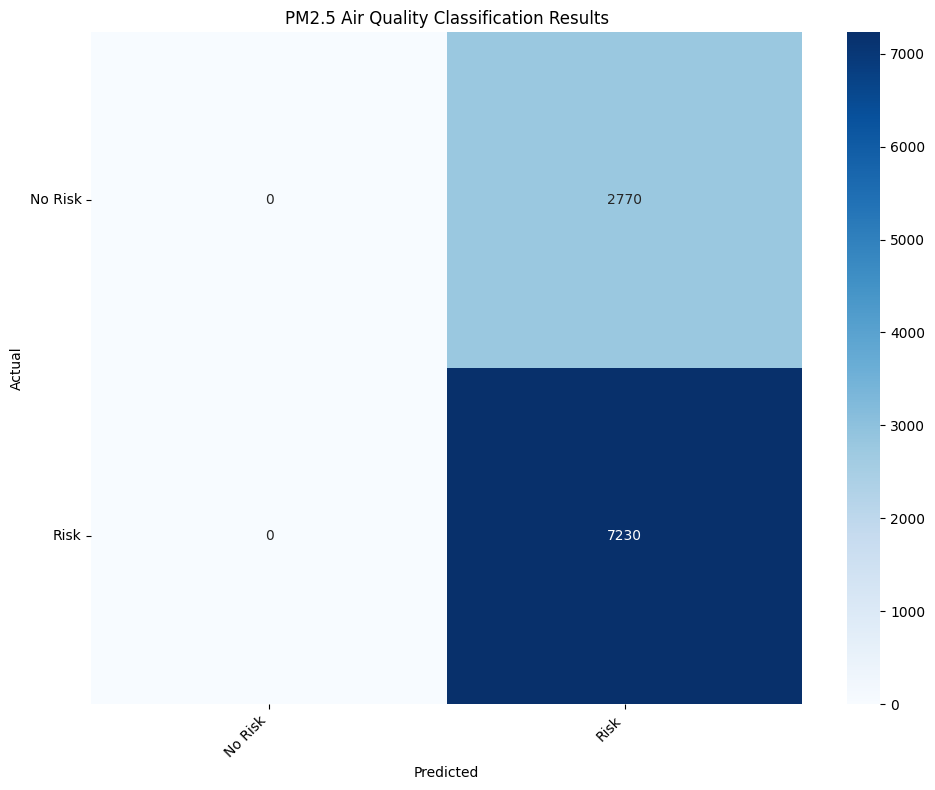


Classification Distribution:
Predicted categories: {'Risk': np.int64(10000)}
Actual categories: {'Risk': np.int64(7230), 'No Risk': np.int64(2770)}


In [5]:
mae_total = 0.0
predicted_categories = []
actual_categories = []

# ---------- STRICT feature alignment (no fillers) ----------


def assert_features_match(df_eval: pd.DataFrame, feat_cols_train):
    missing = [c for c in feat_cols_train if c not in df_eval.columns]
    extra = [c for c in df_eval.columns if c not in feat_cols_train and c not in {
        "timestamp", "tile_id", "lat", "lon", "PM25_ug_m3"}]
    if missing:
        raise ValueError(
            f"CSV is missing {len(missing)} training features (strict, no fillers): {missing[:10]}{'...' if len(missing) > 10 else ''}")
    # reorder to training order; keep only what we need
    keep = ["timestamp", "tile_id", "lat", "lon",
            "PM25_ug_m3", "class"] + list(feat_cols_train)
    return df_eval[keep]

# ---------- rebuild model from checkpoint config ----------


def build_model(F_in, L_current):
    if F != F_in:
        raise ValueError(
            f"Feature-count mismatch: checkpoint expects F={F}, but your feat_cols has F={F_in}.")

    model = PatchToQGRU72(
        in_features=F_in, L=L_current, H=H_OUT,
        patch_len=P, stride=S, d_model=D_MODEL, hidden_size=HIDDEN_SIZE,
        n_qubits=N_QUBITS, n_qlayers=N_QLAYERS, backend="default.qubit"
    )
    return model, H_OUT, P, S


def pm25_to_aqi(pm25_value: float):
    """
    Convert PM2.5 concentration (µg/m³) to AQI using US EPA breakpoints.
    Returns a tuple (AQI_value, category).
    """
    # Breakpoints: (PM_low, PM_high, AQI_low, AQI_high, Category)
    breakpoints = [
        (0.0, 12.0, 0, 50, "No Risk"),
        (12.1, 35.4, 51, 100, "No Risk"),
        (35.5, 55.4, 101, 150, "Risk"),
        (55.5, 150.4, 151, 200, "Risk"),
        (150.5, 250.4, 201, 300, "Risk"),
        (250.5, 350.4, 301, 400, "Risk"),
        (350.5, 500.4, 401, 500, "Risk"),
    ]

    for BP_lo, BP_hi, I_lo, I_hi, category in breakpoints:
        if BP_lo <= pm25_value <= BP_hi:
            aqi = (I_hi - I_lo) / (BP_hi - BP_lo) * (pm25_value - BP_lo) + I_lo
            return round(aqi), category

    # Out of range
    return None, "Value out of range (0-500.4 µg/m³)"


def plot_confusion_matrix(y_true, y_pred, title="Confusion Matrix"):
    """Plot confusion matrix for classification results"""
    labels = ["Good", "Moderate", "Unhealthy for Sensitive Groups",
              "Unhealthy", "Very Unhealthy", "Hazardous"]

    # Get unique labels that actually appear in the data
    unique_labels = sorted(list(set(y_true + y_pred)))

    cm = confusion_matrix(y_true, y_pred, labels=unique_labels)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=unique_labels, yticklabels=unique_labels)
    plt.title(title)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


def calculate_classification_metrics(y_true, y_pred):
    """Calculate and display classification metrics"""
    accuracy = accuracy_score(y_true, y_pred)

    print(f"\n{'='*50}")
    print(f"CLASSIFICATION RESULTS")
    print(f"{'='*50}")
    print(f"Overall Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")
    print(f"Total Samples: {len(y_true)}")

    print(f"\nDetailed Classification Report:")
    print("-" * 50)
    print(classification_report(y_true, y_pred, zero_division=0))

    return accuracy


@torch.no_grad()
def generalization_smoke_from_csv_strict(csv_path, examples=10):
    global predicted_categories, actual_categories, mae_total

    # Reset classification lists
    predicted_categories = []
    actual_categories = []
    mae_total = 0.0

    # 1) Load raw and KEEP NATIVE cadence (no resampling/filling)
    df_raw = pd.read_csv(csv_path)
    df_eval = prepare_dataframe_noresample(df_raw, dayfirst=False)

    # 2) Load checkpoint & pull config (model type, patch params, y stats)
    ckpt = torch.load(best_path, map_location=device)
    cfg = ckpt["config"]
    y_mean = torch.tensor(cfg["y_mean"], dtype=torch.float32, device=device)
    y_std = torch.tensor(cfg["y_std"],  dtype=torch.float32, device=device)
    feat_cols = get_feature_cols(df_eval)

    # 3) STRICT feature alignment — must match training feat_cols exactly
    # feat_cols from TRAIN session
    df_eval = assert_features_match(df_eval, feat_cols)
    feat_cols, mean, std = compute_feature_stats(df_eval)
    F = len(feat_cols)

    # 4) Build the correct model class with the SAME patch params as training
    #    Use your current L (must be >= P). H will be pulled from the ckpt.
    model, H_ckpt, P, S = build_model(F_in=F, L_current=L)
    if P > L:
        raise ValueError(
            f"Patch length P={P} from ckpt is longer than L={L}. Set L >= P or retrain.")
    model = model.to(device)
    model.load_state_dict(ckpt["model_state"], strict=True)
    model.eval()

    # 5) Build eval dataset on native cadence (strict windows, no NaNs)
    cad_min = dominant_cadence_minutes(df_eval)  # likely 60 from your probes
    ds_eval = TSWindowDatasetNative(
        df_eval, L=L, H=H_ckpt, stride=1,
        stats=(feat_cols, mean, std),  # TRAIN stats (no re-fit!)
        cadence_min=cad_min
    )
    if len(ds_eval) < examples:
        raise SystemExit(
            f"[!] Not enough windows in {csv_path} for L={L}, H={H_ckpt}. "
            f"Found {len(ds_eval)}; need ≥ {examples}. Reduce L/H or use more data."
        )
    eval_loader = DataLoader(ds_eval, batch_size=examples,
                             shuffle=True, drop_last=False, collate_fn=collate_keep_meta)

    # 6) One random batch -> inference (model outputs normalized; convert back)
    batch = next(iter(eval_loader))
    x = batch["x_hist"].to(device)
    y_true = batch["y_future"].to(device)
    meta = batch.get("meta", {})
    data_class = batch.get("data_class", [])
    y_hat_n = model(x)
    y_pred = y_hat_n * y_std + y_mean

    mae = torch.mean(torch.abs(y_pred - y_true)).item()
    rmse = torch.sqrt(torch.mean((y_pred - y_true)**2)).item()
    B, Hh = y_pred.shape

    print(f"\n[GENERALIZATION SMOKE - {os.path.basename(csv_path)}] "
          f"model={cfg.get('model_name')}  P={P} S={S}  L={L} H={H_ckpt}  "
          f"B={B} | MAE {mae:.2f} µg/m³ | RMSE {rmse:.2f} µg/m³")

    # 7) Show N examples and collect classification data
    regression_errors = []

    for i in range(min(examples, B)):
        try:
            id_str = f" | tile={meta['tile_id'][i]} start={meta['start_time'][i]}"
        except Exception:
            id_str = ""

        e_mae = torch.mean(torch.abs(y_pred[i] - y_true[i])).item()
        e_rmse = torch.sqrt(torch.mean((y_pred[i] - y_true[i])**2)).item()
        regression_errors.append(e_mae)

        tgt = np.round(y_true[i].cpu().numpy(), 2).tolist()
        prd = np.round(y_pred[i].cpu().numpy(), 2).tolist()

        # Use the last prediction for classification (most future point)
        aqi, pred_category = pm25_to_aqi(prd[-1])
        actual_category = data_class[i]
        actual_category = "No Risk" if actual_category in [

            "Good", "Moderate"] else "Risk"

        # Store for overall classification analysis
        predicted_categories.append(pred_category)
        actual_categories.append(actual_category)

        mae_total += e_mae

        # Show detailed results for first few examples
        if i < 10:  # Show first 10 examples in detail
            print(f"\nExample {i+1}{id_str}")
            print(f" target ({H_ckpt}): {tgt}")
            print(f"  pred  ({H_ckpt}): {prd}")
            print(f"  MAE {e_mae:.2f} µg/m³ | RMSE {e_rmse:.2f} µg/m³")
            print(f"  Predicted Category: {pred_category}")
            print(f"  Actual Category: {actual_category}")
            match_status = "✓ MATCH" if pred_category == actual_category else "✗ MISMATCH"
            print(f"  Classification: {match_status}")

    return regression_errors


# --- run the test ---
print("Running model evaluation and classification testing...")
errors = generalization_smoke_from_csv_strict(
    csv_path, examples=examples_to_show)

# Calculate overall metrics
avg_mae = mae_total / examples_to_show
print(f"\nRegression Performance:")
print(f"Average MAE: {avg_mae:.2f} µg/m³")

# Calculate and display classification metrics
accuracy = calculate_classification_metrics(
    actual_categories, predicted_categories)

# Plot confusion matrix
plot_confusion_matrix(actual_categories, predicted_categories,
                      title="PM2.5 Air Quality Classification Results")

# Additional analysis
print(f"\nClassification Distribution:")
print(
    f"Predicted categories: {dict(pd.Series(predicted_categories).value_counts())}")
print(
    f"Actual categories: {dict(pd.Series(actual_categories).value_counts())}")